# COM 466/4504 Digital Image Processing
**Practical Coursework 2**



<br><br>
<font color='green'>Zerzavot
</font>



## Outlier


- Introduction
    - Access data from google drive
    - Path of images
    - Libraries
    - Helper Functions
    - Analysis of Image
- Task 1
    - Method 1
    - Method 2
- Task 2
- Task 3
- Task 4
    - Dilation
    - Erosion
    - Closing
    - Opening






# Introduction

>*In this work we are going to use the golbasiCampus-Degraded.jpg image that was obtained with reducing contrast and addition of noise. We will apply 4 tasks and try to improve the image in different aspects.*<br><br>




<font color='red'>**Task 1**</font>
<br>
Task description: Work on the degraded image and apply image restoration (noise removal) techniques to remove noise.

<font color='red'>**Task 2**</font>
<br>
Task description: Enhance the output from Task 1 in terms of contrast.


<font color='red'>**Task 3**</font>
<br>
Task description: Analyze the image and find out if you can enhance this image for visual appeal.

<font color='red'>**Task 4**</font>
<br>
Task description: Convert the image to grayscale. Then, apply thresholding to produce a binary image.Then, apply dilation, erosion, closing, and opening morphological operations on the binary image.


## Access data from google drive

In [2]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [3]:
ls "/content/drive/My Drive/opencv/pic"

bilateral20.jpg             task2_sep_contrast.jpg
brightness_contrast.jpg     task2_whole_contrast.jpg
contr_1.jpg                 task3_equalizeHist.jpg
cont_whole.jpg              task3_equalizeHist_sharp.jpg
gaussian_1.jpg              task3_equalizeHist_unsharp.jpg
golbasiCampus-Degraded.jpg  task3_equ.jpg
golbasiCampus.jpg           task3_gau_equ.jpg
intensity.jpg               task3_gau_equ_sharp.jpg
sharp5.jpg                  task3_gau.jpg
task1_contra_gau.jpg        task3_notgau_equ.jpg
task1_contra.jpg            task3_sharp6.jpg
task1_contra_median.jpg     task3_sharp7.jpg
task1_nonlocal_mean.jpg     task4_adap_gau.jpg
task2_contrast.jpg          task4_adap_mean.jpg
task2_full_contrast.jpg


## Path of images

In [7]:
degraded_image= "/content/drive/My Drive/opencv/pic/golbasiCampus-Degraded.jpg"

task1_1="/content/drive/My Drive/opencv/task1_contra.jpg"
task1_2="/content/drive/My Drive/opencv/pic/task1_contra_gau.jpg"

task2_1="/content/drive/My Drive/opencv/task2_1_contrast.jpg"
task2_2="/content/drive/My Drive/opencv/task2_2_contrast_equ.jpg"

task3_1="/content/drive/My Drive/opencv/task3_1_sharp.jpg"


## Libraries

We are going to use OpenCV via Python. We need numpy for arithmetic operations and we used matplotlib library to view image results and histograms.

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

## Helper Functions
Helper function means a function that performs part of the computation of another function. We wrote various functions to read and write images and express the results more clearly. <br>


<font color='blue'>**Read & Write**</font>

**read**: It reads an image from its path. 

**read_convertBGRtoRGB**: It reads an image from its path, then convert it to RGB image. 

**read_convertgray**: It reads an image from its path, then convert it to grayscale. 


**write**: It takes an RGB image then convert it to BGR image. As a final step, it save the result in new_path location.


<font color='blue'>**Display an Image**</font>

**show_img_cv**: You can show the image result thanks to opencv.

**show_img**: You can show the image result thanks to matplotlib. It shows the result in size of 10×20.


**visu**: It takes the old image and the new image that has been processed. It shows these two images side by side.

<font color='blue'>**Histogram Analysis**</font>


**grayscale_histogram**: It takes the path of image then, it convert it to grayscale and calculate the histogram. Finally, it plots the image histogram.

**color_histogram**: It takes the path of image then, it calculate three separate histograms one each for the R, G and B channels. Finally, it plots histogram results.


In [6]:
def read(path):
    img=cv2.imread(path)
    return img
    
def read_convertgray(path):
    imgray=cv2.imread(path,cv2.IMREAD_GRAYSCALE)
    return imgray

def read_convertBGRtoRGB(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

def write(rgb_img,new_path):
    """
    Take an rgb image then, convert it to bgr image.
    Save the result in new_path location.
    """
    img = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2BGR)
    cv2.imwrite(new_path, img)

def show_img_cv(img,name="default"):
    cv2.imshow(name,img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

def show_img(img,text="Image"):
    fig = plt.figure(figsize=(10, 20))
    ax1 = fig.add_subplot(1, 1, 1)
    ax1.axis("off")
    ax1.title.set_text(text)
    ax1.imshow(img)
    
def visu(image,new_image,before="Before",after="After"):
    fig = plt.figure(figsize=(25, 45))

    ax1 = fig.add_subplot(2, 2, 1)
    ax1.axis("off")
    ax1.title.set_text(before)
    ax2 = fig.add_subplot(2, 2, 2)
    ax2.axis("off")
    ax2.title.set_text(after)

    ax1.imshow(image)
    ax2.imshow(new_image)

def grayscale_histogram(path):
    img = cv2.imread(path,0)
    hi= [0]*256
    rows= img.shape[0]
    cols= img.shape[1]
    for r in range(rows-1):
        for c in range(cols-1):
            pixel = img[r,c]
            hi[pixel] += 1
    plt.plot(hi)
    plt.show()  

def grayscale_histogram2(img):
    
    hi= [0]*256
    rows= img.shape[0]
    cols= img.shape[1]
    for r in range(rows-1):
        for c in range(cols-1):
            pixel = img[r,c]
            hi[pixel] += 1
    plt.plot(hi)
    plt.show()  


def color_histogram(path,title='Histogram Analysis'):
    img = cv2.imread(path)
    color = ('blue', 'green', 'red')


    for i,color in enumerate(color):
        histogram = cv2.calcHist([img],[i],None,[256],[0,256])
      
        plt.plot(histogram, color=color, label=color+' channel')
        plt.xlim([0,256])

    plt.title(title,fontsize=15)
    plt.xlabel('Range intensity values',fontsize=10)
    plt.ylabel('Count of Pixels',fontsize=10)
    plt.legend()
    plt.show()

## Analysis of Image

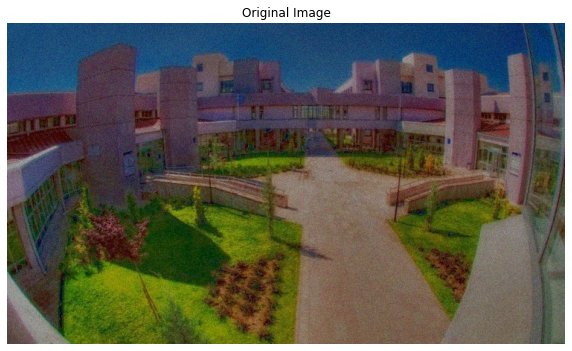

In [ ]:
image= read_convertBGRtoRGB(degraded_image)
show_img(image,text="Original Image")

In some cases only one channel of image have the noise. So to understand this, i split the image R,G,B channel then,look at the results and their histograms. I realise that all 3 channel has salt and pepper noise. 

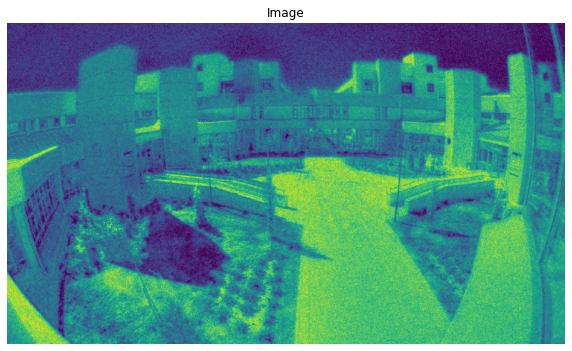

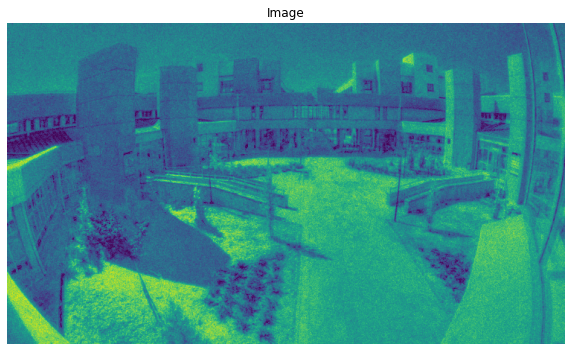

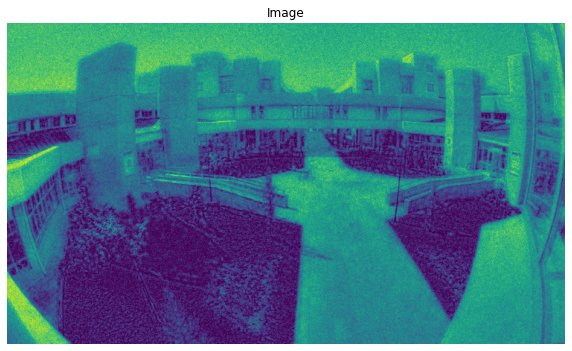

In [ ]:
r,g,b = cv2.split(image)
show_img(r)
show_img(g)
show_img(b)

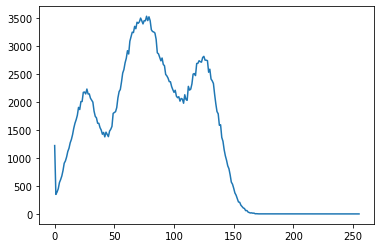

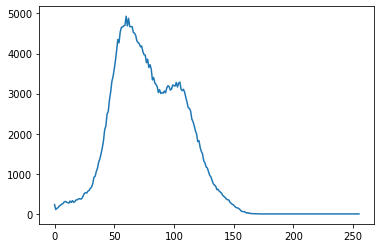

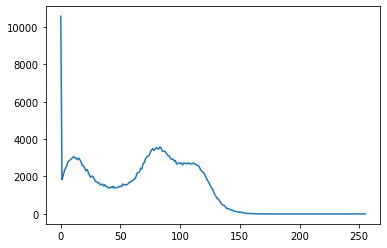

In [ ]:
grayscale_histogram2(r)
grayscale_histogram2(g)
grayscale_histogram2(b)

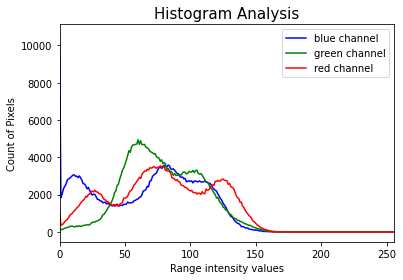

In [ ]:
color_histogram(degraded_image)

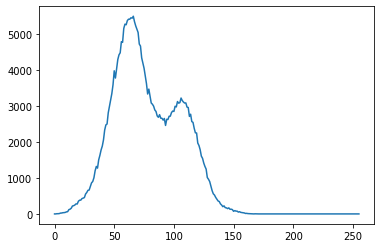

In [ ]:
grayscale_histogram(degraded_image)

### **Result**:
When we are looking at our image, we can say the image have salt and pepper noise. Detection of noise model is our next step. We should look at the histogram of image. Finally, we realize that our image has a Gaussian noise.


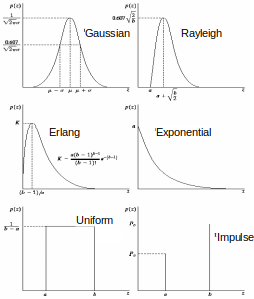

# Task 1

## Method 1: Non-local means algorithm

The Non-Local Means algorithm is used for refinement of image and preserving detail of image while removing the noise.
It restores the original image much better than standard median-based filter and it is more effective at reducing the salt and pepper noise.
When setting h and hColor, we tried 3. The noise in the photo was not removed to the desired extent. Also, when we set it to 10, we got a very blurry image. As a result, we decided to set the h and hColor values to 5.
When deciding the value for templateWindowSize and searchWindowSize, we used the recommended values(7 pixels and 21 pixels).


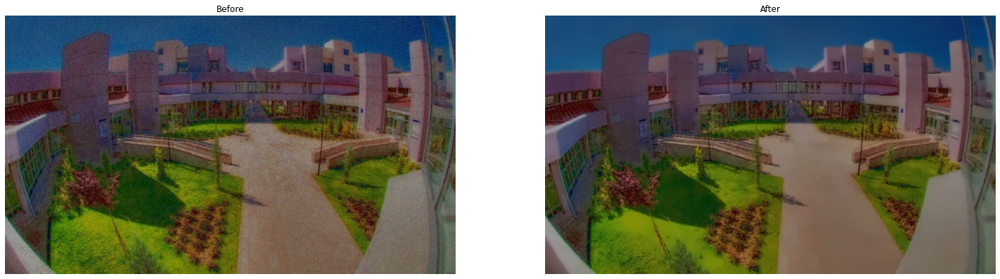

In [ ]:
img = read_convertBGRtoRGB(degraded_image)

dst = cv2.fastNlMeansDenoisingColored(img,None,5,5,7,21)

visu(img,dst)

**Result of First Method:** Salt and pepper noise has been removed and the details of the image were preserved.

## Method 2: The combination of the contra-harmonic mean with the gaussian filter 


Contra-Harmonic Mean filter is used to remove Gaussian type noise and preserve edge features.

Based on this expression we write CHM_operator() function:

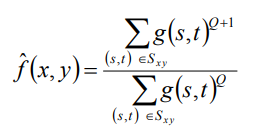



We used Contraharmonic Mean for pepper and salt noise. Positive values of Q eliminate pepper noise(Q taken as a 3). 

In [ ]:

def CHM_operator(roi,q):
    roi = roi.astype(np.float64) #Copy of the roi
    dividend= np.mean((roi)**(q+1)) # 
    divisor=np.mean((roi)**(q))
    quo= dividend/divisor
    return quo
def CHM_Algo(image,q):
    new_image = np.zeros(image.shape)
    image = cv2.copyMakeBorder(image,1,1,1,1,cv2.BORDER_DEFAULT)
    for i in range(1,image.shape[0]-1):
        for j in range(1,image.shape[1]-1):
            a=i-1
            b=j-1
            new_image[a,b] = CHM_operator(image[a:a+3,b:b+3],q)
    
    i_min=np.min(image) # min pixel
    i_max=np.max(image) # max pixel
    new_image = (new_image-i_min) * (255/i_max)
    new_image = new_image.astype(np.uint8)
    return new_image

def CHM_rgb(image,q):
    r,g,b = cv2.split(image)
    r = CHM_Algo(r,q)
    g = CHM_Algo(g,q)
    b = CHM_Algo(b,q)
    return cv2.merge([r,g,b])

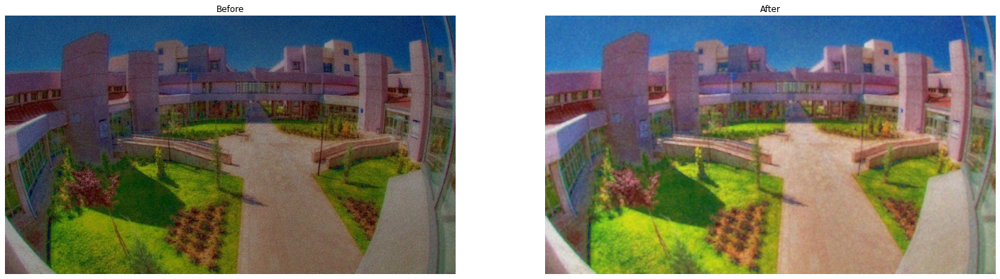

In [ ]:
image=read_convertBGRtoRGB(degraded_image)

img_cont=CHM_rgb(image,3)
#show_img(img_cont,"Contra Harmonic Mean")

visu(image,img_cont)

Then we aimed to remove the salt noise by taking the value of q negative(Q taken as a -1.5). 

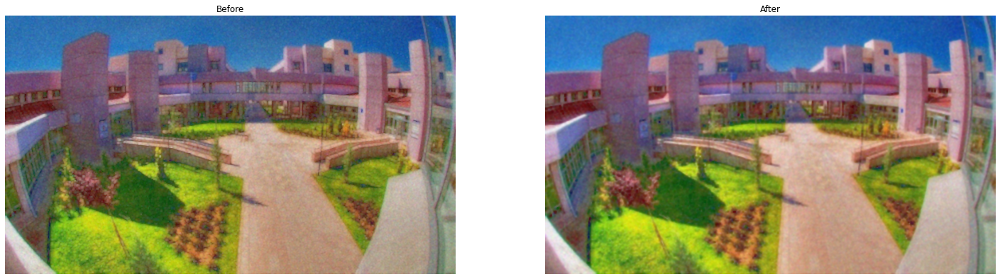

In [ ]:
image=img_cont

img_cont2=rgbContra_harmonicMean(image,-1.5)
#show_img(img_cont,"Contra Harmonic Mean")

visu(image,img_cont2)

In [ ]:
task1_1="/content/drive/My Drive/opencv/task1_contra.jpg"
write(img_cont2,task1_1)

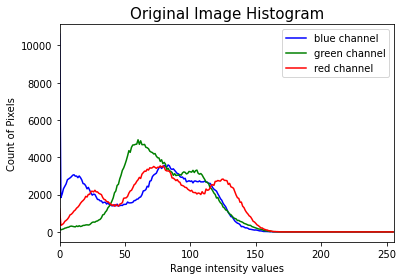

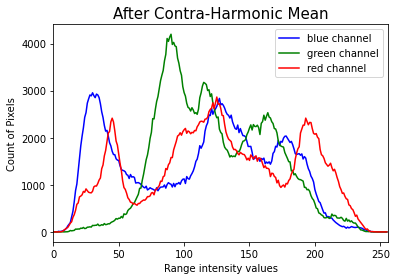

In [ ]:
color_histogram(degraded_image,"Original Image Histogram")
color_histogram(task1_1,"After Contra-Harmonic Mean")

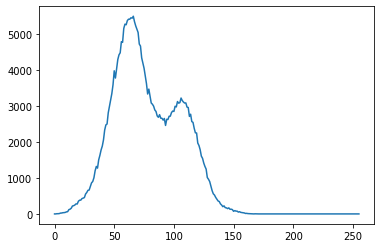

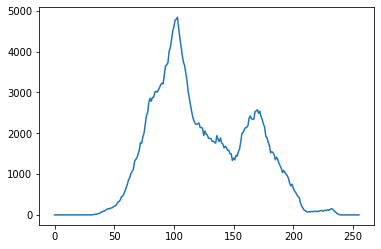

In [ ]:
grayscale_histogram(degraded_image)
grayscale_histogram(task1_1)

Then we apply the gaussian filter( kernel size taken as a 5).

rgb ye bölüp uyguladığını de



In [ ]:
def gaussian_filter(image,size):
  
  r_image, g_image, b_image = cv2.split(image)

  r = cv2.GaussianBlur(r_image,(size,size),cv2.BORDER_DEFAULT)
  g = cv2.GaussianBlur(g_image,(size,size),cv2.BORDER_DEFAULT)
  b = cv2.GaussianBlur(b_image,(size,size),cv2.BORDER_DEFAULT)

  new_image = cv2.merge((r, g, b))

  return new_image

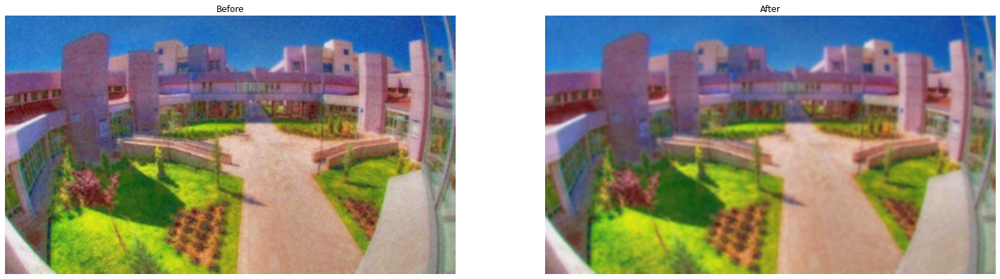

In [ ]:
img_rgb= img_cont2
img_rgb_gau= gaussian_filter(img_rgb,5)
#show_img(img_rgb_gau)

visu(img_rgb,img_rgb_gau)


In [ ]:
task1_2="/content/drive/My Drive/opencv/pic/task1_contra_gau.jpg"
write(img_rgb_gau,task1_2)

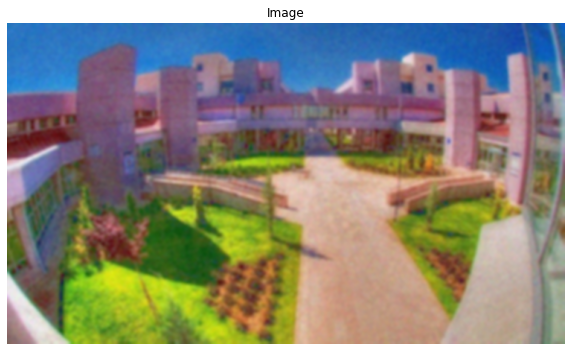

In [ ]:
show_img(img_rgb_gau)

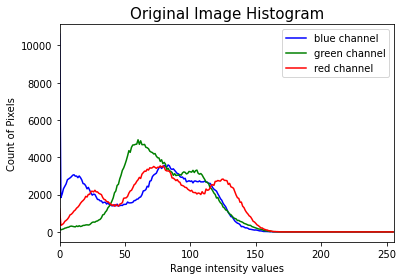

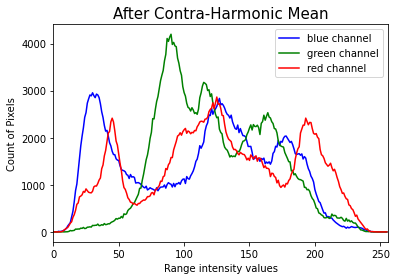

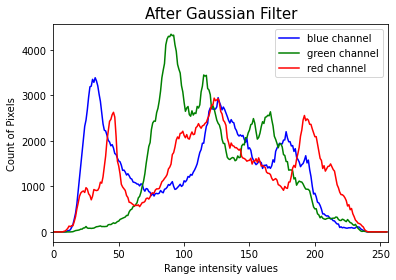

In [ ]:
color_histogram(degraded_image,"Original Image Histogram")
color_histogram(task1_1,"After Contra-Harmonic Mean")
color_histogram(task1_2,"After Gaussian Filter")

**Result of Second Method:** Salt and pepper noise and gaussian noise have been removed but image details has been lost. 

When we compare the two methods, we can say that the first method is better. 
Since we are only allowed to use the methods discussed in the course, we will continue with the result of the second method. 



# Task 2


**Task description:** Enhance the output from Task 1 in terms of contrast.



In [ ]:
def contrast_enhancement(image):
    brightness=0
    r_image, g_image, b_image = cv2.split(image)
    r =  cv2.addWeighted(r_image, 1, r_image, 0, brightness)
    g =  cv2.addWeighted(g_image, 1.1, g_image, 0, brightness)
    b =  cv2.addWeighted(b_image, 1.2, b_image, 0, brightness)
    """
    Enhance constrast and brightness of images
    """
    #img_enhanced = cv2.addWeighted(image, contrast, image, 0, brightness)
    img_enhanced = cv2.merge((r, g, b))

    return img_enhanced

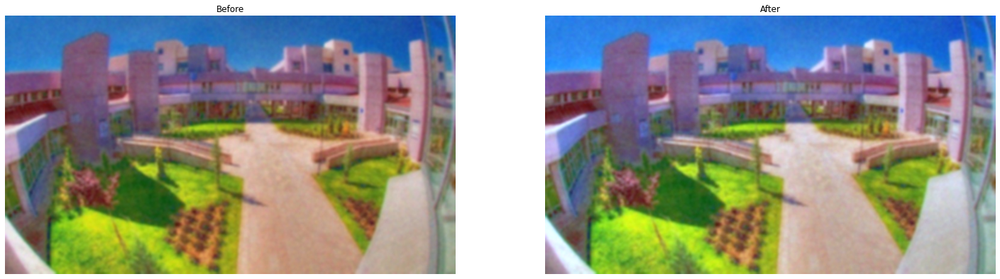

In [ ]:
image=read_convertBGRtoRGB(task1_2)

result=contrast_enhancement(image)

visu(image,result)

In [ ]:
task2_1="/content/drive/My Drive/opencv/task2_1_contrast.jpg"
write(result,task2_1)

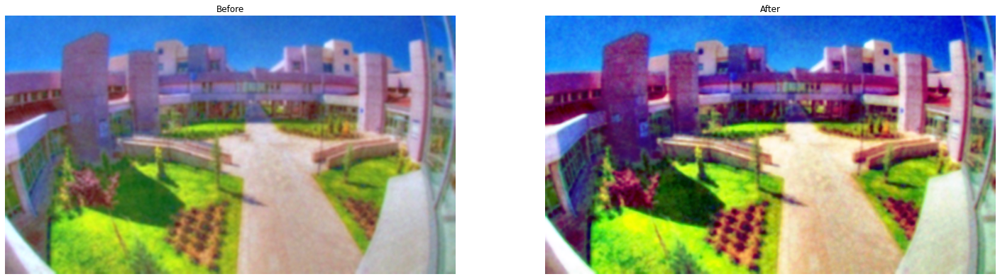

In [ ]:
def equalize(image):
  
  r_image, g_image, b_image = cv2.split(image)

  r = cv2.equalizeHist(r_image)
  g = cv2.equalizeHist(g_image)
  b = cv2.equalizeHist(b_image)

  new_image = cv2.merge((r, g, b))

  return new_image

result2=  equalize(result)
visu(result,result2)

task2_2="/content/drive/My Drive/opencv/task2_2_contrast_equ.jpg"
write(result2,task2_2)

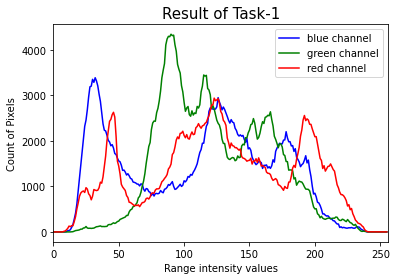

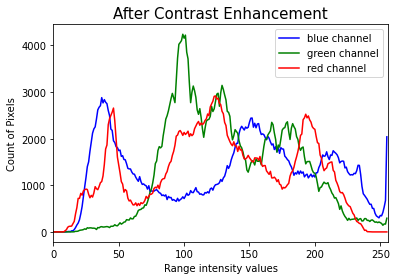

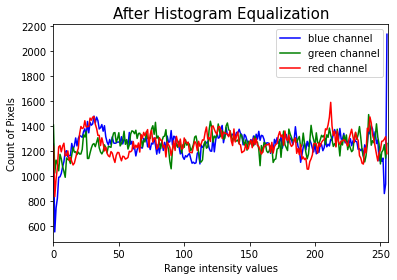

In [ ]:
color_histogram(task1_2,"Result of Task-1")
color_histogram(task2_1,"After Contrast Enhancement")
color_histogram(task2_2,"After Histogram Equalization")


# Task 3

Analiz

resmimizin renk dengesi çok güzel gözüküyor. Fakat bulanık bir görüntümüz var.Bunu gidermek için sharpening yapıcaz.

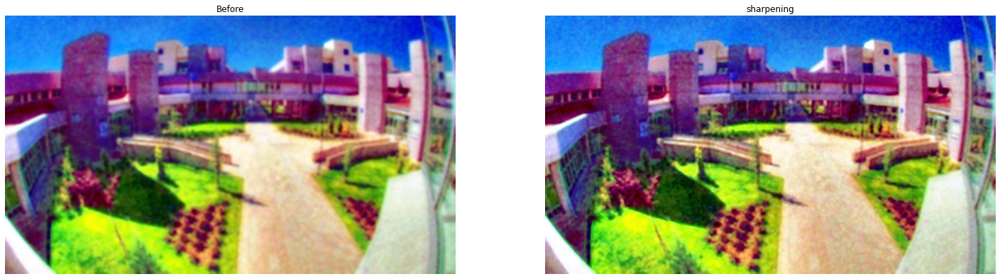

In [ ]:
img= result2

#read_convertBGRtoRGB(task2_2)

# Creating our sharpening filter
filter = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

sharpen_img_1=cv2.filter2D(img,-1,filter)

#show_img(sharpen_img_1)
visu(img,sharpen_img_1,after="sharpening")

In [ ]:
task3_1="/content/drive/My Drive/opencv/task3_1_sharp.jpg"
write(sharpen_img_1,task3_1)

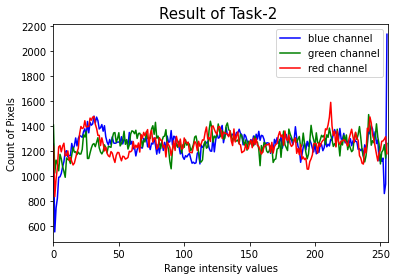

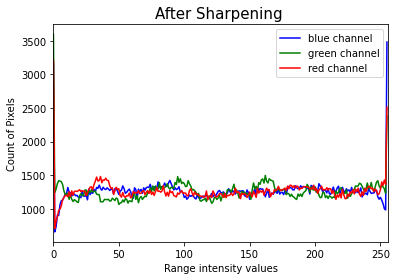

In [ ]:
color_histogram(task2_2,"Result of Task-2 ")
color_histogram(task3_1,"After Sharpening ")

# Task 4

In simple thresholding, the threshold value is global and it is same for all pixels in the image. When we applied the simple threshold with average intensity as the threshold value, the image became very fuzzy. So we decided to apply an adaptive threshold. In adaptive thresholding, the threshold value is calculated for smaller regions so there will be different threshold values for different regions. We used adaptiveThreshold() method to apply it on our image. 

In [28]:
img=read_convertgray(task3_1)

mean_value= np.mean(img)
print(mean_value)


128.37974013921115


In [32]:
mean_value=int(mean_value+1)
mean_value

129

## Simple Threshold

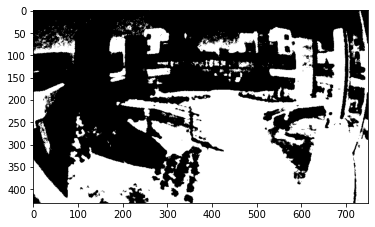

In [33]:
ret,thresh1 = cv2.threshold(img,mean_value,255,cv2.THRESH_BINARY)

plt.imshow(thresh1,cmap="gray")
plt.show()

## Adaptive Threshold

If the pixel value more than the threshold value, lets change it as a 255. And our adaptive method is ADAPTIVE_THRESH_MEAN_C. Threshold value will be the mean of neighborhood area. The blocksize is 51. It is the size of the pixelneighborhood used to calculate the threshold value. The reason we made this choice is to see the differences between morphological processes more clearly.

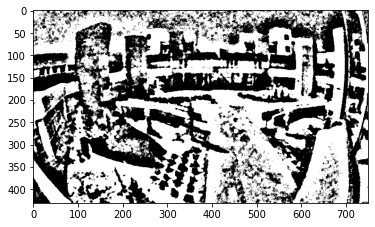

True

In [37]:
th3 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                          cv2.THRESH_BINARY, 51, 5)


plt.imshow(th3,cmap="gray")
plt.show()


task4_1="/content/drive/My Drive/opencv/task4_adap_mean.jpg"

cv2.imwrite(task4_1, th3) 

We chose a 2 × 2 kernel size for the morphological operations. We will use the same size for all.


In [38]:
img = cv2.imread(task4_1,0)
kernel = np.ones((2,2),np.uint8)

## Dilation

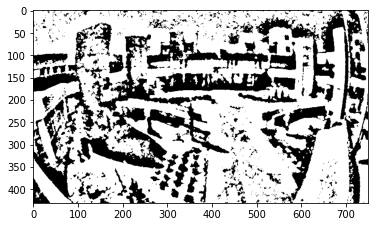

In [39]:
dilation = cv2.dilate(img,kernel,iterations = 1)
plt.imshow(dilation,cmap="gray")
plt.show()

## Erosion

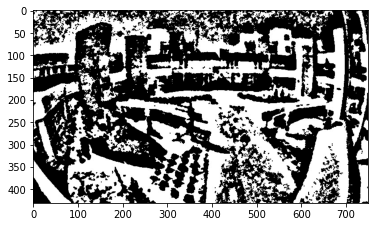

In [40]:
erosion = cv2.erode(img,kernel,iterations = 1)

plt.imshow(erosion,cmap="gray")
plt.show()

## Opening

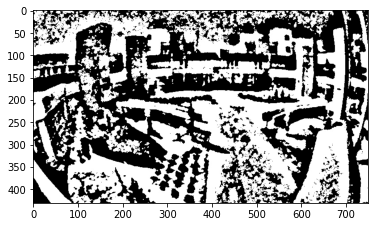

In [41]:
opening = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
plt.imshow(opening,cmap="gray")
plt.show()

## Closing

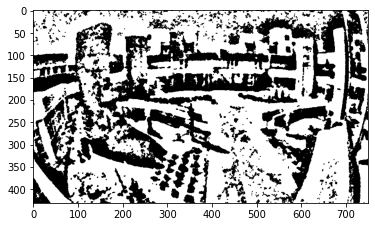

In [42]:
closing = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
plt.imshow(closing,cmap="gray")
plt.show()